# Data Preprocessing and Exploration



### Machine Learning II Project

   - Bruno Moreira            | 20211574@novaims.unl.pt
   - Carolina Braziel Shaul   | 20211557@novaims.unl.pt
   - Madalena Dias Frango     | 20211522@novaims.unl.pt

<br>

---
<br>

## Table of Contents

[1. Importing Data & Libraries](#1-bullet)<br>
<br>
[2. Customers Dataset Analysis](#2-bullet)<br> 
<br>
[2.1. Preprocessing: Data Cleaning, Feature Extraction and Feature Selection](#2.1.-bullet)<br>
<br>
[2.2. Univariate Analysis and Features' Distributions](#2.2.-bullet) <br>
<br>
[2.2.1. Individuals](#2.1.1.-bullet)<br>
<br>
[2.2.2. Supermarkets](#2.1.2.-bullet)<br>
<br>
[2.3. Multivariate Analysis (Individuals)](#2.3.-bullet)<br>
<br>
[2.4. Data Adjustments](#2.4.-bullet)<br>

<br>

---
<br>

<a class="anchor" id="1-bullet">     
    

## 1. Importing Data & Libraries 

</a>


In [1]:
#Basic Packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date 
import squarify

#To find addresses
import reverse_geocoder as rg
from geopy.geocoders import Nominatim

#Plot Maps
import folium
from folium.plugins import HeatMap, MarkerCluster 

#Functions
import Functions

%load_ext autoreload
%autoreload 2

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")

c:\Users\carolinashaul\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\carolinashaul\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\carolinashaul\AppData\Local

In [2]:
customers = pd.read_csv('Customer Info Dataset.csv')
transactions = pd.read_csv('Customer Basket Dataset.csv')
prod_mapping = pd.read_excel('Product Mapping Excel File.xlsx')

<br>

---
<br>

<a class="anchor" id="2-bullet">     
    

## 2. Customers Dataset Analysis

</a>

<a class="anchor" id="2.1.-bullet">     
    

### 2.1. Preprocessing: Data Cleaning, Feature Extraction and Feature Selection

</a>

#### Verifying duplicates

In [3]:
customers[customers['customer_id'].duplicated() == True]

,customer_id,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,...,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude


In [4]:
customers.set_index('customer_id', inplace=True)

In [5]:
customers[customers.duplicated() == True]

,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,...,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude
customer_id,,,,,,,,,,,,,,,,,,,,,


 #### Summary Statistics

In [6]:
customers.describe().T

,count,mean,std,min,25%,50%,75%,max
kids_home,30000.0,1.146700e+00,1.234111,0.000000e+00,0.000000,1.000000,1.000000,10.000000
teens_home,30000.0,5.129333e-01,0.912502,0.000000e+00,0.000000,0.000000,1.000000,9.000000
number_complaints,30000.0,7.643667e-01,0.836341,0.000000e+00,0.000000,1.000000,1.000000,9.000000
distinct_stores_visited,30000.0,6.120767e+00,6.511410,0.000000e+00,2.000000,3.000000,8.000000,21.000000
lifetime_spend_groceries,30000.0,3.978634e+03,5280.641466,0.000000e+00,220.000000,950.000000,5253.000000,18852.000000
lifetime_spend_electronics,30000.0,9.652388e+02,1755.323397,1.058527e+00,45.000000,194.000000,721.000000,6603.000000
typical_hour,30000.0,-inf,NaN,-inf,9.000000,14.000000,20.000000,23.000000
lifetime_spend_vegetables,30000.0,5.642078e+02,481.819086,1.000000e+00,247.000000,425.000000,785.000000,1568.000000
lifetime_spend_nonalcohol_drinks,30000.0,6.287501e+02,496.346400,0.000000e+00,244.000000,425.000000,949.000000,1671.000000
lifetime_spend_alcohol_drinks,30000.0,3.793445e+02,236.206400,0.000000e+00,193.000000,419.000000,537.000000,1048.000000


> Some weird patterns can be detected above: both variables *typical_hour* and *lifetime_spend_videogames* possess infinite values, which given their context, conditions their interpretation. Below, a more in-depth analysis of these features is done.

In [7]:
customers[customers['lifetime_spend_videogames'] == -np.inf]

,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,...,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude
customer_id,,,,,,,,,,,,,,,,,,,,,
1441,Fausto`s Supermarket,male,01/23/1989 11:26 AM,0.0,0.0,0.0,1.0,2.678482,1.095507,0.575646,...,2.613335,34425.0,1.556140,-inf,0.978006,0.199261,2008.0,961221.0,38.866242,-9.110871
3399,Sandy`s Supermarket,female,07/11/1970 12:57 PM,0.0,0.0,0.0,1.0,2.797932,1.141087,0.447940,...,2.623429,36152.0,1.555148,-inf,0.997246,0.201933,2009.0,NaN,38.866366,-9.111207
8086,Eugene`s Supermarket,male,02/29/1956 08:26 PM,0.0,0.0,0.0,1.0,2.802438,1.146242,0.173287,...,2.612483,34777.0,1.530623,-inf,0.951666,0.210895,2010.0,NaN,38.865887,-9.111353
9706,Michele`s Supermarket,female,12/06/1962 02:12 AM,0.0,0.0,0.0,1.0,2.844843,1.184050,0.708303,...,2.615854,35000.0,1.555148,-inf,0.997246,0.200211,2009.0,NaN,38.866273,-9.111174
17805,Robert`s Supermarket,male,09/22/1982 03:36 AM,0.0,0.0,0.0,1.0,2.751432,1.127715,0.599474,...,2.619223,35809.0,1.553152,-inf,1.006338,0.195712,2008.0,NaN,38.866607,-9.111206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4689,Justin`s Supermarket,male,03/20/1959 03:59 PM,0.0,0.0,0.0,1.0,2.741558,1.113587,0.621227,...,2.613508,34834.0,1.552650,-inf,0.967800,0.203212,2011.0,NaN,38.866031,-9.111438
16270,Melissa`s Supermarket,female,05/11/1996 05:49 AM,0.0,0.0,0.0,1.0,2.768803,1.175120,0.519860,...,2.619885,34631.0,1.571034,-inf,0.987811,0.198526,2008.0,NaN,38.865962,-9.110773
10262,Francis`s Supermarket,male,11/05/1970 01:58 AM,0.0,0.0,0.0,1.0,2.788190,1.130447,0.693147,...,2.621949,34708.0,1.553152,-inf,0.957160,0.191255,2010.0,NaN,38.866438,-9.111502


In [8]:
customers[customers['typical_hour'] == -np.inf]

,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,...,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude
customer_id,,,,,,,,,,,,,,,,,,,,,
8592,Charles`s Supermarket,male,01/18/1988 04:13 AM,0.0,0.0,0.0,1.0,2.64414,1.130447,-inf,...,2.615969,35005.0,1.540302,-inf,0.95716,0.196409,2013.0,NaN,38.866685,-9.111366
101,Annie`s Supermarket,female,11/23/1947 10:33 AM,0.0,0.0,0.0,1.0,2.65918,1.133150,-inf,...,2.608573,34702.0,1.553652,-inf,0.91589,0.194451,2009.0,910065.0,38.866048,-9.111718


> It seems that this particularity solely applies to customers who have present in their name "Supermarket". For this reason, we will perform a separate analysis to this group.

In [9]:
(customers[customers['customer_name'].str.contains('Supermarket')]).describe().T

,count,mean,std,min,25%,50%,75%,max
kids_home,226.0,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00
teens_home,226.0,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00
number_complaints,226.0,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00
distinct_stores_visited,226.0,1.000000e+00,0.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000e+00
lifetime_spend_groceries,226.0,2.701444e+00,0.057132,2.423006e+00,2.669260,2.707140,2.741420,2.844843e+00
lifetime_spend_electronics,226.0,1.149498e+00,0.026245,1.058527e+00,1.130447,1.151293,1.165860,1.222587e+00
typical_hour,226.0,-inf,NaN,-inf,0.575646,0.693147,0.722593,7.838736e-01
lifetime_spend_vegetables,226.0,2.124160e+00,0.026242,2.042546e+00,2.105281,2.126912,2.143535,2.183680e+00
lifetime_spend_nonalcohol_drinks,226.0,2.302082e+00,0.012521,2.266444e+00,2.293678,2.303334,2.309999,2.334485e+00
lifetime_spend_alcohol_drinks,226.0,2.704784e+00,0.002484,2.697901e+00,2.703110,2.704669,2.706443,2.712882e+00


> As it is possible to perceive, the Supermarket Group has a very distinct behaviour: the standard deviation for many variables either is or tends to 0, meaning that this is quite a homogeneous selection of observations.

 #### Correcting Missing Values and Features dtypes

In [10]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 4239 to 2570
Data columns (total 23 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   customer_name                            30000 non-null  object 
 1   customer_gender                          30000 non-null  object 
 2   customer_birthdate                       30000 non-null  object 
 3   kids_home                                30000 non-null  float64
 4   teens_home                               30000 non-null  float64
 5   number_complaints                        30000 non-null  float64
 6   distinct_stores_visited                  30000 non-null  float64
 7   lifetime_spend_groceries                 30000 non-null  float64
 8   lifetime_spend_electronics               30000 non-null  float64
 9   typical_hour                             30000 non-null  float64
 10  lifetime_spend_vegetables                300

> There exist missing values solely in the feature *loyalty_card_number*, which can translate as "non-applicable" (the individual has no loyalty card associated to them). In these cases, imputation should not be considered - and due to the percentage of observations within this condition and the meaning of this feature, it does not present great value. For this reason, it will be further used to create a binary variable indicating whether the customer has a loyalty card or not. 

In [11]:
customers['customer_birthdate'] = pd.to_datetime(customers['customer_birthdate'])
Functions.integer_convert(customers, ['number_complaints', 'kids_home', 'teens_home', 'distinct_stores_visited', 'lifetime_total_distinct_products', 'year_first_transaction'])

,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,...,lifetime_spend_meat,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude
customer_id,,,,,,,,,,,,,,,,,,,,,
4239,Sara Moscowitz,female,1999-09-10 15:11:00,0,0,0,2,91.0,20.0,22.0,...,53.0,48.0,47.0,105.0,85,0.192154,2017,NaN,38.754263,-9.163397
19330,Donald Robertson,male,1981-06-26 22:58:00,1,0,0,2,197.0,5958.0,21.0,...,86.0,80.0,45.0,1964.0,85,0.098647,2015,NaN,38.777761,-9.156197
2272,Phd. Felicia Bradshaw,female,1987-01-31 09:08:00,1,1,0,20,397.0,20.0,9.0,...,204.0,170.0,46.0,5.0,408,0.497251,2008,NaN,38.785329,-9.127113
25288,Emma Williams,female,1942-06-17 00:02:00,3,4,1,2,5282.0,237.0,12.0,...,1081.0,1068.0,617.0,1078.0,1956,0.206713,2010,NaN,38.744086,-9.156589
12829,Hilda Huerta,female,2000-01-31 11:43:00,0,0,0,2,82.0,22.0,21.0,...,39.0,39.0,48.0,103.0,83,0.200625,2015,NaN,38.756024,-9.162970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,Phd. Karen Watts,female,1974-11-01 05:26:00,0,0,1,2,209.0,5474.0,20.0,...,21.0,11.0,57.0,1984.0,112,0.096366,2008,935162.0,38.734446,-9.171911
26447,Curtis Thompson,male,1986-02-21 11:27:00,0,0,0,3,185.0,1066.0,15.0,...,47.0,41.0,50.0,197.0,22,0.118998,2014,NaN,38.767070,-9.144301
182,Richard Carter,male,2001-01-14 05:49:00,0,0,0,2,83.0,23.0,23.0,...,55.0,52.0,51.0,94.0,77,0.199432,2016,953891.0,38.728487,-9.164140


#### Feature Extraction

Several features will be created. Some solely for the individual customers (non-supermarket), while others for all observations. Their descriptions follow:

_For individual clients_:

- **minors_household**: Number of minors present in the household.
- **education**: Individual's education level.
- **birthday**: Individual's day of birth.
- **birthmonth**: Individual's month of birth.
- **age**: Individual's age.
- **total_lifetime_spend**: Total lifetime amount spent.


_For all customers_:
- **loyalty_card**: Whether the customer has a loyalty card or not.
- **latitude_encoded**: Latitude of the municipality of residence of the customer.
- **longitude_encoded**: Longitude of the municipality of residence of the customer.

##### Creating the features _for all customers_

In [12]:
#Loyalty Card
Functions.binary_encoding(customers, col = 'loyalty_card', 
                          condition = (np.isnan(customers['loyalty_card_number']) == True))


#customers['address'] = customers.apply(lambda row: Functions.get_address(row), axis=1)

,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,...,lifetime_spend_fish,lifetime_spend_hygiene,lifetime_spend_videogames,lifetime_total_distinct_products,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude,loyalty_card
customer_id,,,,,,,,,,,,,,,,,,,,,
4239,Sara Moscowitz,female,1999-09-10 15:11:00,0,0,0,2,91.0,20.0,22.0,...,48.0,47.0,105.0,85,0.192154,2017,NaN,38.754263,-9.163397,0
19330,Donald Robertson,male,1981-06-26 22:58:00,1,0,0,2,197.0,5958.0,21.0,...,80.0,45.0,1964.0,85,0.098647,2015,NaN,38.777761,-9.156197,0
2272,Phd. Felicia Bradshaw,female,1987-01-31 09:08:00,1,1,0,20,397.0,20.0,9.0,...,170.0,46.0,5.0,408,0.497251,2008,NaN,38.785329,-9.127113,0
25288,Emma Williams,female,1942-06-17 00:02:00,3,4,1,2,5282.0,237.0,12.0,...,1068.0,617.0,1078.0,1956,0.206713,2010,NaN,38.744086,-9.156589,0
12829,Hilda Huerta,female,2000-01-31 11:43:00,0,0,0,2,82.0,22.0,21.0,...,39.0,48.0,103.0,83,0.200625,2015,NaN,38.756024,-9.162970,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,Phd. Karen Watts,female,1974-11-01 05:26:00,0,0,1,2,209.0,5474.0,20.0,...,11.0,57.0,1984.0,112,0.096366,2008,935162.0,38.734446,-9.171911,1
26447,Curtis Thompson,male,1986-02-21 11:27:00,0,0,0,3,185.0,1066.0,15.0,...,41.0,50.0,197.0,22,0.118998,2014,NaN,38.767070,-9.144301,0
182,Richard Carter,male,2001-01-14 05:49:00,0,0,0,2,83.0,23.0,23.0,...,52.0,51.0,94.0,77,0.199432,2016,953891.0,38.728487,-9.164140,1


In [13]:
# customers.to_csv('customers_location.csv', index=True)

In [14]:
customers2 = pd.read_csv('customers_location.csv')

In [15]:
customers2.set_index('customer_id', inplace=True)

In [16]:
customers = pd.concat([customers, customers2['address']], axis=1)

In [17]:
customers['region'] = customers['address'].apply(lambda row: Functions.clean_address(row))
Functions.encode_address(customers, 'latitude', 'longitude', 'region')

,customer_name,customer_gender,customer_birthdate,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,...,percentage_of_products_bought_promotion,year_first_transaction,loyalty_card_number,latitude,longitude,loyalty_card,address,region,latitude_encoded,longitude_encoded
customer_id,,,,,,,,,,,,,,,,,,,,,
4239,Sara Moscowitz,female,1999-09-10 15:11:00,0,0,0,2,91.0,20.0,22.0,...,0.192154,2017,NaN,38.754263,-9.163397,0,"Estádio Universitário de Lisboa, Azinhaga das ...",Alvalade,38.753506,-9.150181
19330,Donald Robertson,male,1981-06-26 22:58:00,1,0,0,2,197.0,5958.0,21.0,...,0.098647,2015,NaN,38.777761,-9.156197,0,"Avenida David Mourão-Ferreira, Bairro da Cruz ...",Lumiar,38.768765,-9.163855
2272,Phd. Felicia Bradshaw,female,1987-01-31 09:08:00,1,1,0,20,397.0,20.0,9.0,...,0.497251,2008,NaN,38.785329,-9.127113,0,"Rua Engenheiro Adão Manuel Ramos Barata, Sacav...",Loures,38.821100,-9.115927
25288,Emma Williams,female,1942-06-17 00:02:00,3,4,1,2,5282.0,237.0,12.0,...,0.206713,2010,NaN,38.744086,-9.156589,0,"Rua Veloso Salgado, Bairro do Rego, Campo Pequ...",Avenidas Novas,38.737745,-9.152875
12829,Hilda Huerta,female,2000-01-31 11:43:00,0,0,0,2,82.0,22.0,21.0,...,0.200625,2015,NaN,38.756024,-9.162970,0,"Estádio Universitário de Lisboa, Azinhaga das ...",Alvalade,38.753506,-9.150181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,Phd. Karen Watts,female,1974-11-01 05:26:00,0,0,1,2,209.0,5474.0,20.0,...,0.096366,2008,935162.0,38.734446,-9.171911,1,"37ª Esquadra - Serafina, 25, Rua Miguel Ângelo...",Campolide,38.731513,-9.166444
26447,Curtis Thompson,male,1986-02-21 11:27:00,0,0,0,3,185.0,1066.0,15.0,...,0.118998,2014,NaN,38.767070,-9.144301,0,"Terminal de Carga Aérea, Avenida Eugénio de An...",Olivais,38.772268,-9.128820
182,Richard Carter,male,2001-01-14 05:49:00,0,0,0,2,83.0,23.0,23.0,...,0.199432,2016,953891.0,38.728487,-9.164140,1,"OPTIMISTIC, Rua Campos Júnior, Bairro de Campo...",Campolide,38.731513,-9.166444


##### Creating the features _for individual customers_ and encoding data

> To create the features for individuals only, we will separate the original dataset into two distinct dataframes, one for each group: individual customers and supermarkets.

In [18]:
supermarkets = customers[customers['customer_name'].str.contains('Supermarket')]

In [19]:
individuals = customers[~customers.isin(supermarkets)].dropna(how='all')

In [20]:
#Total lifetime spent
individuals['total_lifetime_spend'] = individuals[['lifetime_spend_groceries',
       'lifetime_spend_electronics','lifetime_spend_vegetables',
       'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks',
       'lifetime_spend_meat', 'lifetime_spend_fish', 'lifetime_spend_hygiene',
       'lifetime_spend_videogames']].sum(axis=1)


#Minors In Household
individuals['minors_in_household'] = (individuals[['kids_home', 'teens_home']]).sum(axis=1)

#Birthday, Birthmonth and Birthyear
Functions.process_birthdate(individuals, 'customer_birthdate')

#Education Level
individuals['education'] = individuals['customer_name'].apply(lambda row: Functions.extract_education(row))

#Encoding Gender Feature
Functions.binary_encoding(individuals, 'customer_gender', condition=(individuals['customer_gender'] == 'male'))

#Cleansing the customer's name
individuals['customer_name'] = individuals['customer_name'].apply(lambda row: Functions.clean_names(row))

#### Initial Feature Selection

> Due to the features created, some features such as **customer_birthdate** and **loyalty_card_number** reveal not to be useful anymore. For the supermarkets group, due to lack of interpretability of the majority of features, these were not included.

In [21]:
individuals.drop(['customer_birthdate', 'loyalty_card_number', 'address'], axis=1, inplace=True)
supermarkets = supermarkets[['customer_name','percentage_of_products_bought_promotion', 
                   'year_first_transaction', 'loyalty_card', 'region', 
                   'latitude_encoded', 'longitude_encoded']]

#'latitude', 'longitude'

#### Final Conversion of dtypes

In [22]:
Functions.integer_convert(individuals, ['number_complaints', 'kids_home', 'teens_home', 'distinct_stores_visited', 'lifetime_total_distinct_products', 'year_first_transaction', 'typical_hour', 'loyalty_card', 'minors_in_household' ])

,customer_name,customer_gender,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,...,loyalty_card,region,latitude_encoded,longitude_encoded,total_lifetime_spend,minors_in_household,birthday,birthmonth,age,education
customer_id,,,,,,,,,,,,,,,,,,,,,
4239,Sara Moscowitz,1,0,0,0,2,91.0,20.0,22,22.0,...,0,Alvalade,38.753506,-9.150181,1545.0,0,10,9,24,0
19330,Donald Robertson,0,1,0,0,2,197.0,5958.0,21,20.0,...,0,Lumiar,38.768765,-9.163855,10219.0,1,26,6,42,0
2272,Felicia Bradshaw,1,1,1,0,20,397.0,20.0,9,310.0,...,0,Loures,38.821100,-9.115927,1753.0,2,31,1,36,3
25288,Emma Williams,1,3,4,1,2,5282.0,237.0,12,499.0,...,0,Avenidas Novas,38.737745,-9.152875,11195.0,7,17,6,81,0
12829,Hilda Huerta,1,0,0,0,2,82.0,22.0,21,9.0,...,0,Alvalade,38.753506,-9.150181,1370.0,0,31,1,23,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,Karen Watts,1,0,0,1,2,209.0,5474.0,20,18.0,...,1,Campolide,38.731513,-9.166444,9730.0,0,1,11,49,3
26447,Curtis Thompson,0,0,0,0,3,185.0,1066.0,15,267.0,...,0,Olivais,38.772268,-9.128820,2416.0,0,21,2,37,0
182,Richard Carter,0,0,0,0,2,83.0,23.0,23,23.0,...,1,Campolide,38.731513,-9.166444,1491.0,0,14,1,22,0


In [23]:
individuals.to_csv('clientes_preprocessed.csv', index=True)
supermarkets.to_csv('supermarkets preprocessed.csv', index=True)

<br>

---
<br>

<a class="anchor" id="2.2.-bullet">     
    

### 2.2. Univariate Analysis and Features' Distributions

</a>

<a class="anchor" id="2.2.1.-bullet">     
    

#### 2.2.1. Individuals Dataset

</a>

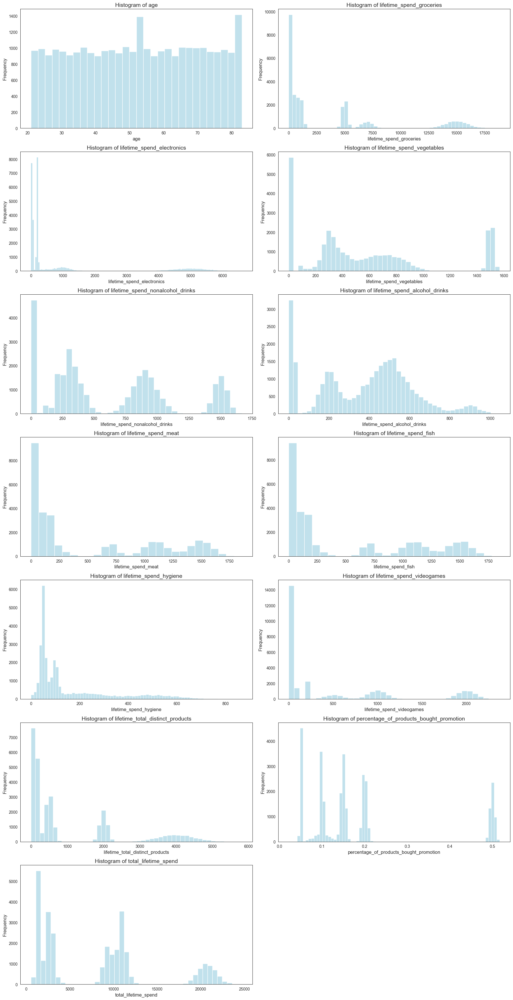

In [24]:
Functions.plot_histograms(individuals, ['age','lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
                              'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks', 'lifetime_spend_meat', 'lifetime_spend_fish',
                              'lifetime_spend_hygiene', 'lifetime_spend_videogames', 'lifetime_total_distinct_products',
                              'percentage_of_products_bought_promotion', 'total_lifetime_spend'])

> The analysis of the continuous variables suggest that there may be several groups in terms of expenditure by product. The same applies to the percentage of products bought with promotions, indicating that perhaps these variables will be important for the segmentation of the customers. In regards to age, the business has customers from several age groups.

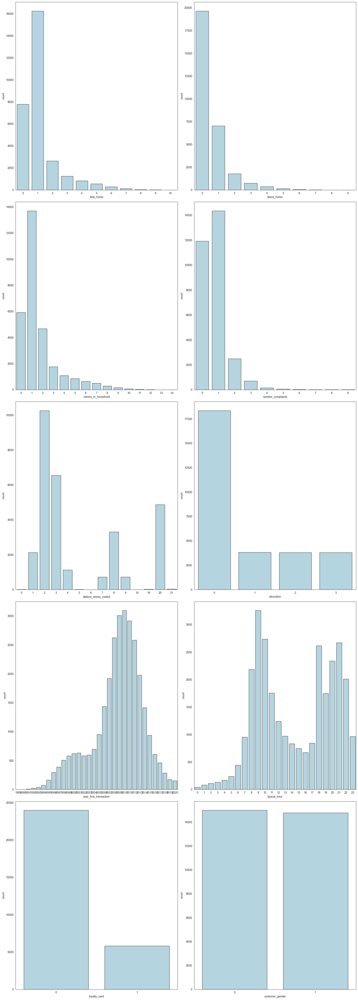

In [25]:
Functions.plot_bar_charts(individuals, ['kids_home', 'teens_home', 'minors_in_household', 
                              'number_complaints', 'distinct_stores_visited', 
                              'education', 'year_first_transaction','typical_hour', 
                              'loyalty_card', 'customer_gender'])

> When analyzing the discrete variables distributions, we find that the customers are equally distributed in terms of gender. The majority seem to have small kids in their households and no teenagers and an undetermined level of education. The majority of customers have complained at least once and tend to visit the stores during the morning or late afternoon. It seems also that the majority of customers first purchased from 2008 to 2013. In terms of distinct stores visited, it seems that once again it is possible to find several groups - those who visit many distinct stores, those who visit relatively less, and those who only visit from 1 to 4.

In [26]:
region_data = Functions.group_by_region(individuals, 'region', ['latitude_encoded', 'longitude_encoded', 
                                               'total_lifetime_spend', 'lifetime_total_distinct_products',
                                               'percentage_of_products_bought_promotion', 'distinct_stores_visited' ])

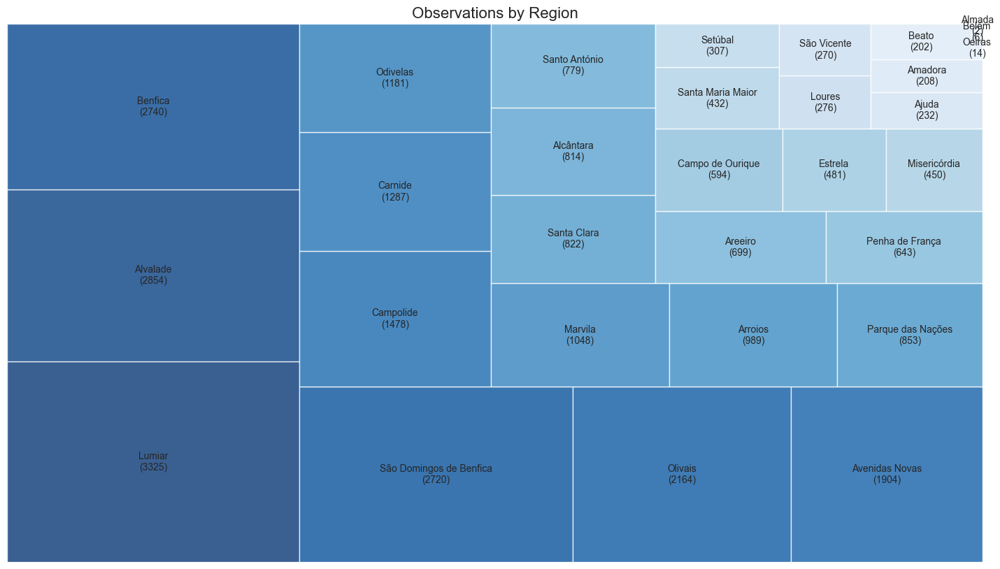

In [27]:
# VER SE DÁ PARA TIRAR O ALMADA OEIRAS BELEM
Functions.regional_treemap(region_data)

<a class="anchor" id="2.2.2.-bullet">     
    

#### 2.2.2. Supermarkets

</a>

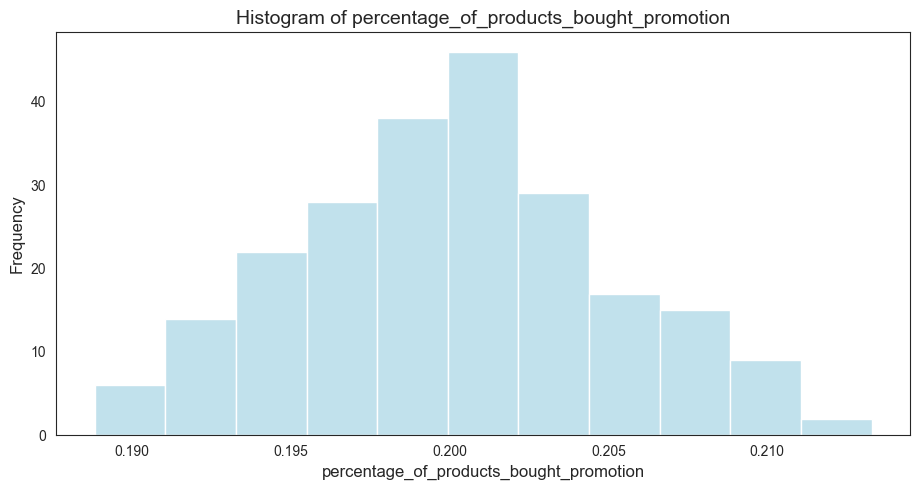

In [28]:
Functions.plot_histograms(supermarkets, ['percentage_of_products_bought_promotion'])

> The percentage of products bought with promotion by supermakets seems to almost follow a normal distribution. This value for the observations within this group has a very narrow range (from 19% to 21%).

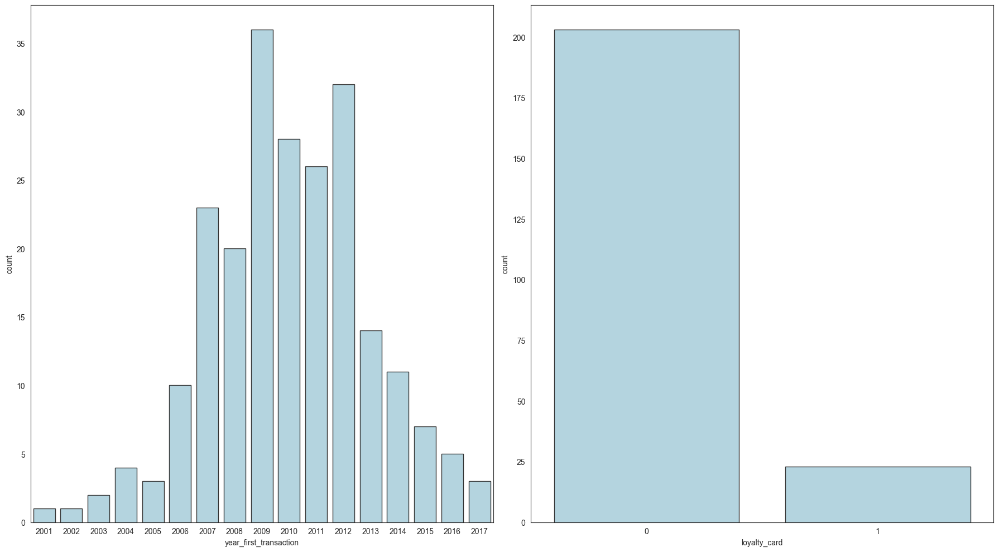

In [29]:
Functions.plot_bar_charts(supermarkets, ['year_first_transaction', 'loyalty_card'])

> The majority of the supermarkets do not have a loyalty, and similarly to the individual customers, seemed to firstly purchase with the chain in the late 2000 and early 2010's.

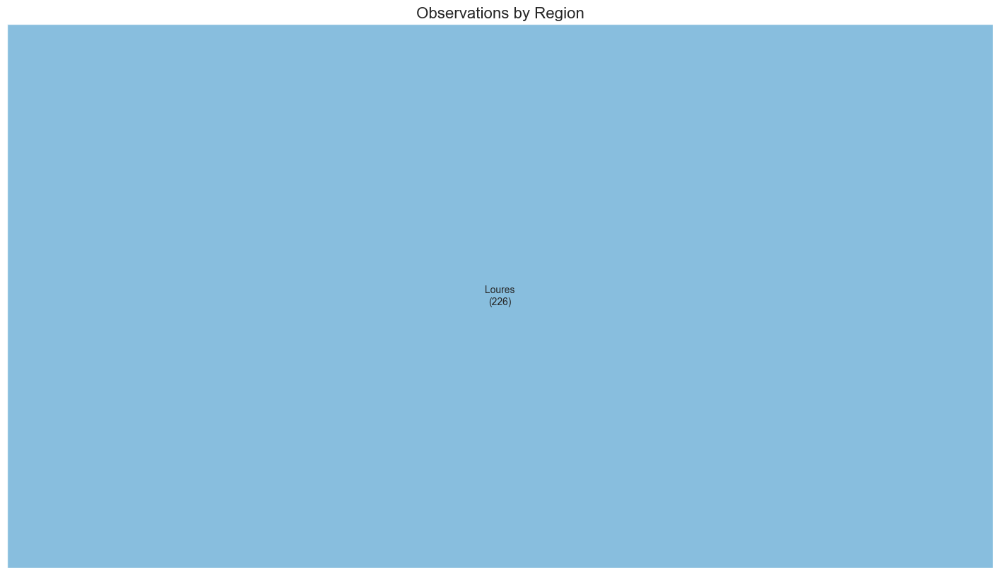

In [30]:
region_data_supermarket = Functions.group_by_region(supermarkets, 'region', ['loyalty_card', 'percentage_of_products_bought_promotion'])
Functions.regional_treemap(region_data_supermarket)

<a class="anchor" id="2.3.-bullet">     
    

### 2.3. Multivariate Analysis (for Individuals)

</a>

#### Assessing Correlation

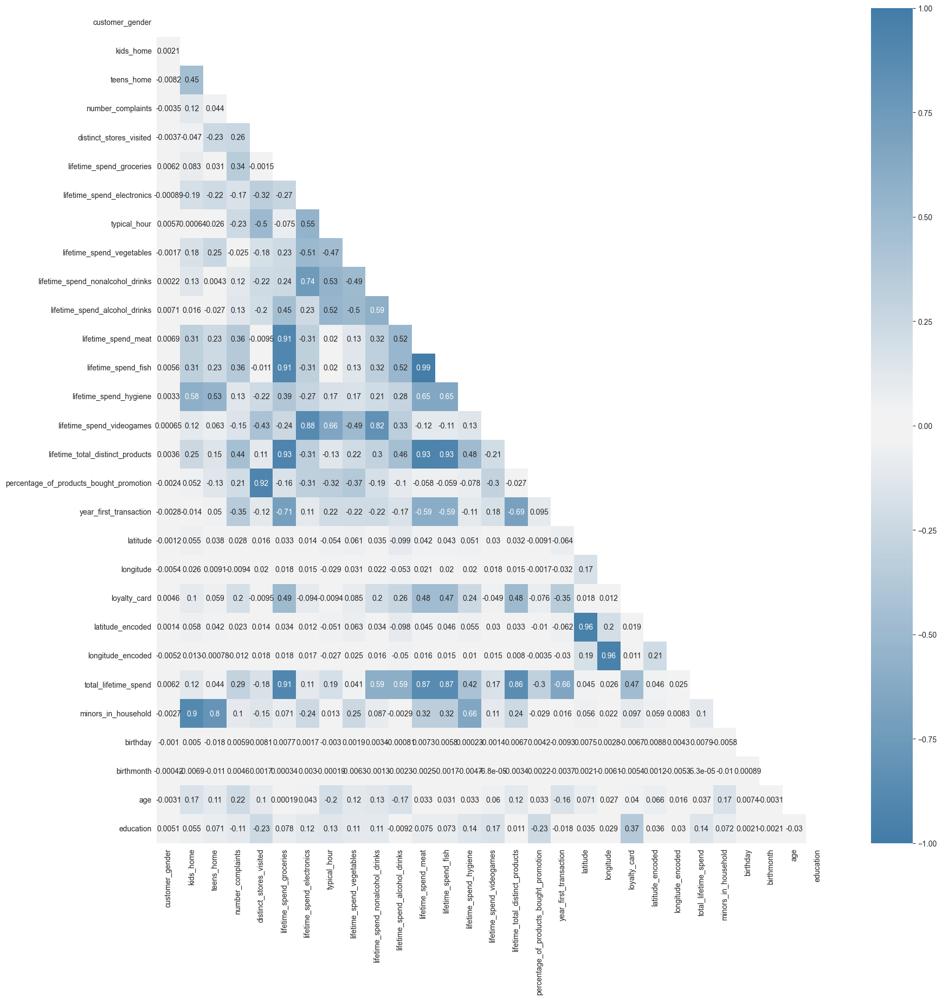

In [31]:
#Choosing a diverging color scheme to visually analyse the correlation
cmap = sns.diverging_palette(240, 240,sep= 10, as_cmap=True)
sns.set_style(style='white')
fig, ax = plt.subplots(figsize=(20, 20))

#Finding the correlation matrix
corr_matrix = individuals.drop(['customer_name', 'region'], axis=1).corr()

#Clearing the correlation matrix such that only the lower triangle appears.
mask = np.tri(*corr_matrix.shape, k=-1, dtype=bool)
corr_matrix.where(mask, np.NaN, inplace=True)

#Plotting the correlation heatmap
sns.heatmap(corr_matrix, 
            cmap=cmap,  
            center= 0,  
            xticklabels=corr_matrix.columns,
            yticklabels=corr_matrix.columns,
            annot=True,
            annot_kws={"fontsize": 10},
            vmin=-1, vmax=1,
            ax=ax)

plt.show()


> Since there are many features to assess, we will narrow down our search to only the most highly correlated pairs.

In [32]:
Functions.get_high_correlations(individuals.corr(), 0.66)

,Variable 1,Variable 2,Correlation
12,lifetime_spend_meat,lifetime_spend_fish,0.986010
20,longitude,longitude_encoded,0.956726
19,latitude,latitude_encoded,0.955708
13,lifetime_spend_meat,lifetime_total_distinct_products,0.929894
15,lifetime_spend_fish,lifetime_total_distinct_products,0.929424
5,lifetime_spend_groceries,lifetime_total_distinct_products,0.926119
2,distinct_stores_visited,percentage_of_products_bought_promotion,0.923021
7,lifetime_spend_groceries,total_lifetime_spend,0.913175
3,lifetime_spend_groceries,lifetime_spend_meat,0.912783
4,lifetime_spend_groceries,lifetime_spend_fish,0.912134


> It seems that fish and meat have almost a perfect positive correlation. This applies also to the total number of total distinct products purchased. Another example is that the amount of stores visited seems to translate into a higher percentage of products bought in discount. 

#### Visualization

> To facilitate the process of viewing the variables interaction, let's divide the features per type. Note that, due to their range, features such as **age**, **birthday**, **year_first_transaction**, **percentage_of_products_bought_promotion**, and **lifetime_total_distinct_products** are being treated as continuous.

In [33]:
continuous = ['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
       'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks',
       'lifetime_spend_meat', 'lifetime_spend_fish', 'lifetime_spend_hygiene',
       'lifetime_spend_videogames', 'lifetime_total_distinct_products',
       'percentage_of_products_bought_promotion', 'year_first_transaction', 'total_lifetime_spend','age']

discrete = ['kids_home', 'teens_home', 'typical_hour', 'birthmonth',
       'number_complaints', 'distinct_stores_visited', 'minors_in_household', 'education']

binary = ['customer_gender', 'loyalty_card']

##### Analyzing Pairplots

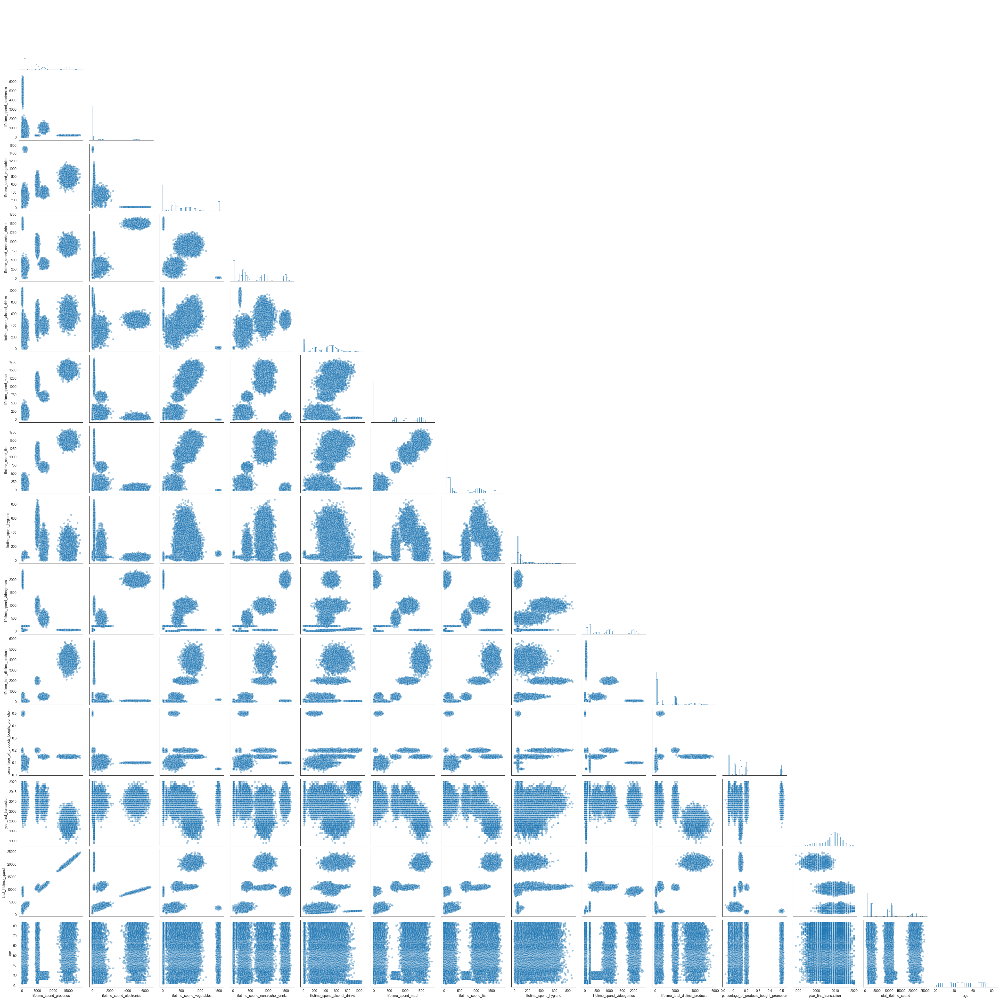

In [34]:
Functions.pairplot(df= individuals, cols= continuous, hue_var = None, sampling = 0)

> As seen prior, it seems that some variable pairs present almost a linear relationship (for example, **lifetime_spend_meat** to **lifetime_spend_fish**), as seen prior within the correlation matrix. This being said, it might be appropriate to perform a junction of these variables. Nevertheless, it seems that for some pairs there are also very clear distinct groups.

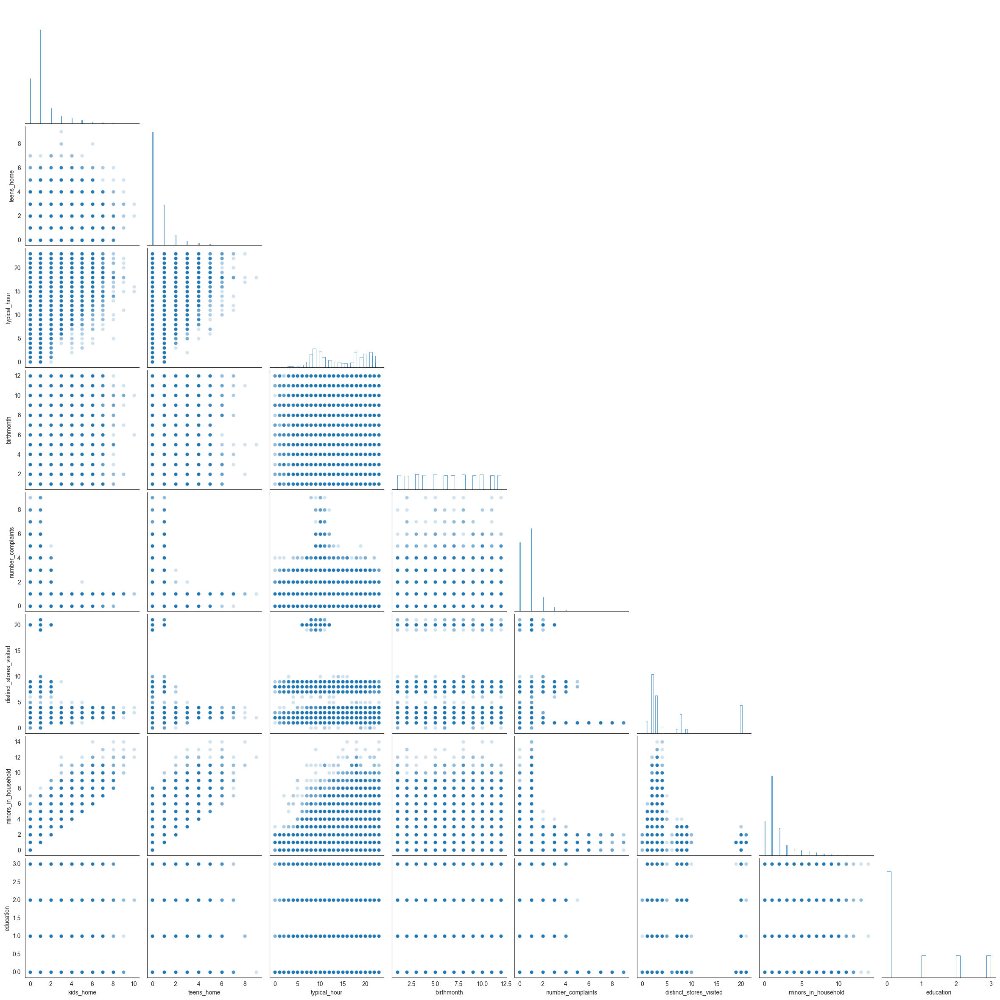

In [35]:
Functions.pairplot(df=individuals, cols= discrete, hue_var=None, sampling=0, transparency=0.2)

> It seems that people with less minors in their households tend to visit the stores later in the day. Additionally, people who visit many stores appear to have relatively less minors in their household.

!!!!ALTERNATIVA SUGERIDA PELA SHAUL DEVIDO AO FACTO DE SEREM DADOS DISCRETOS

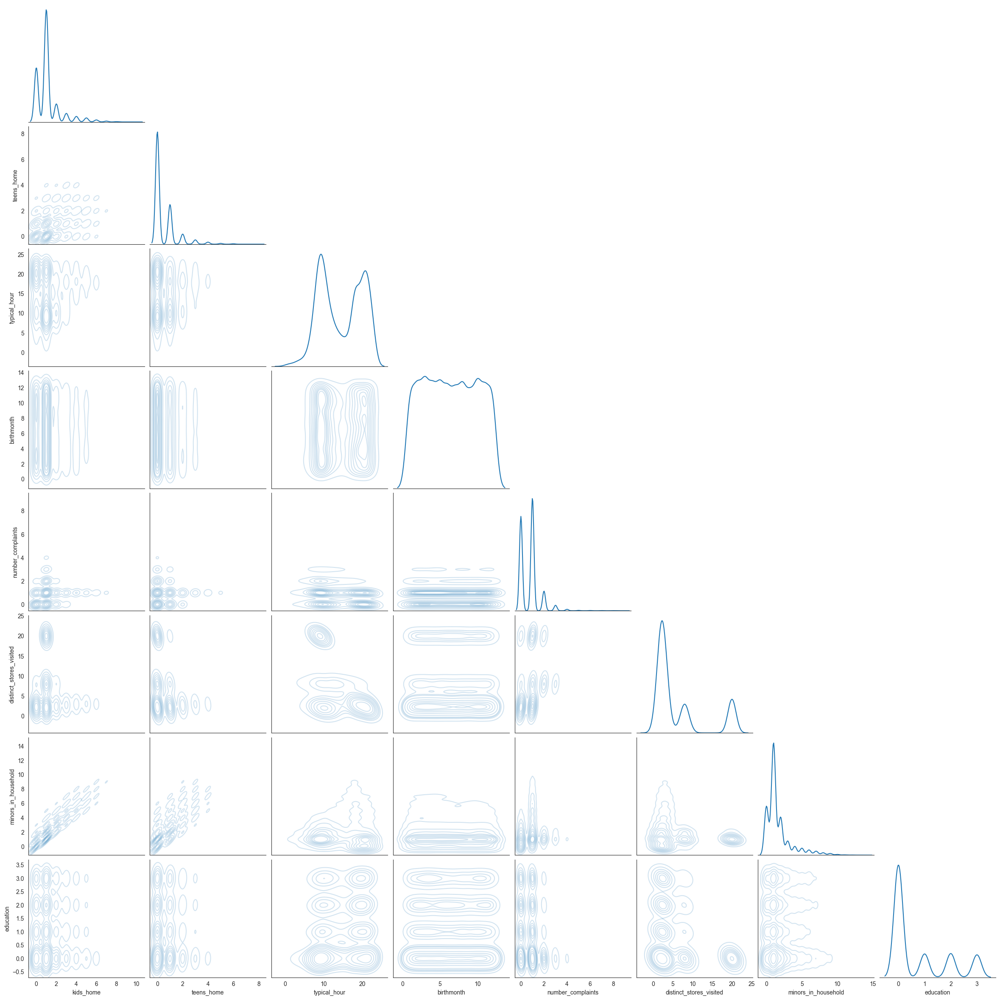

In [36]:
Functions.pairplot(individuals, discrete, None, 10000, 'discrete', 0.2)

##### Binary Variables against Discrete Variables

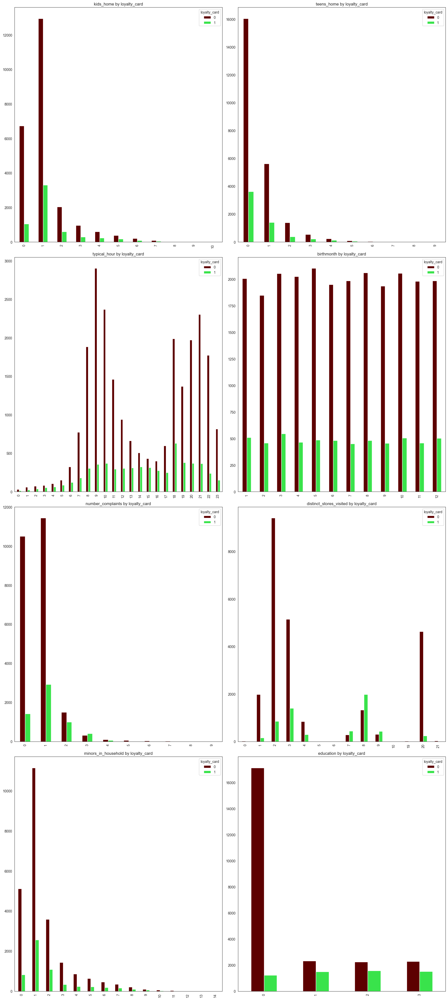

In [37]:
Functions.plot_bar_charts(individuals, discrete, 'loyalty_card', False)

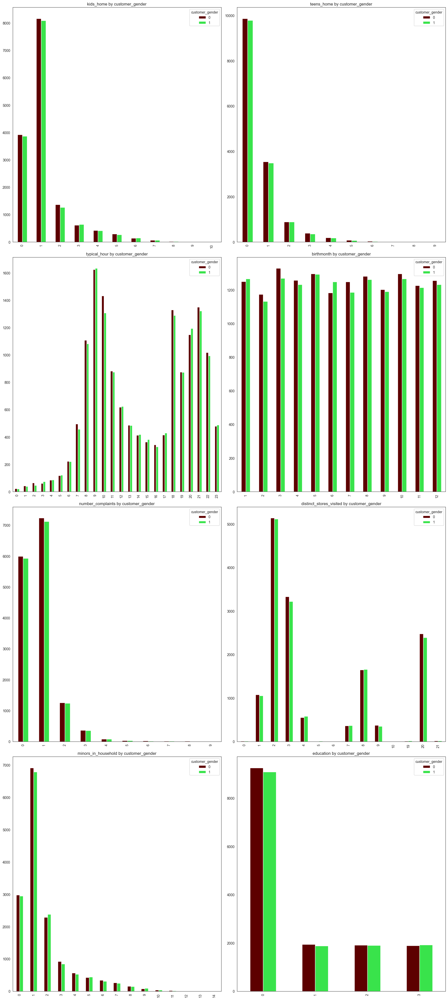

In [38]:
Functions.plot_bar_charts(individuals, discrete, 'customer_gender', False)

##### Binary Variables against Continuous Variables

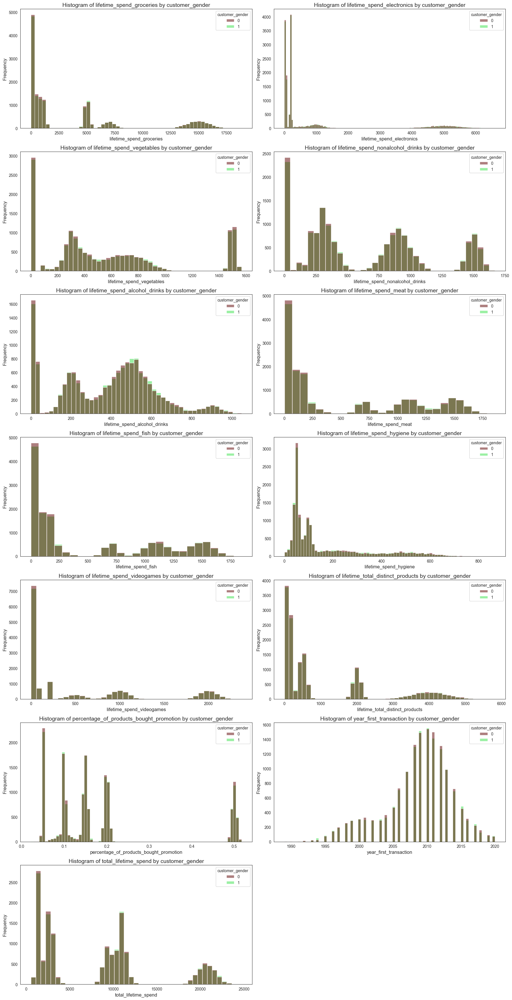

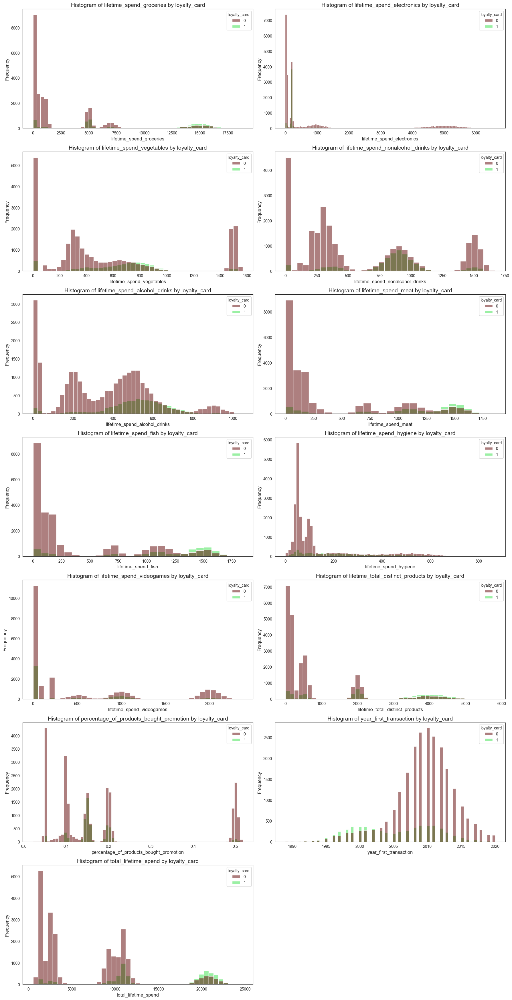

In [44]:
for col in binary:
    Functions.plot_histograms(df= individuals,  cols= ['lifetime_spend_groceries', 'lifetime_spend_electronics',
       'lifetime_spend_vegetables', 'lifetime_spend_nonalcohol_drinks',
       'lifetime_spend_alcohol_drinks', 'lifetime_spend_meat',
       'lifetime_spend_fish', 'lifetime_spend_hygiene',
       'lifetime_spend_videogames', 'lifetime_total_distinct_products',
       'percentage_of_products_bought_promotion', 'year_first_transaction',
       'total_lifetime_spend'], hue_var=col)
    plt.show()

##### Discrete Variables against Continuous Variables

## TROCAR OS EIXOS 

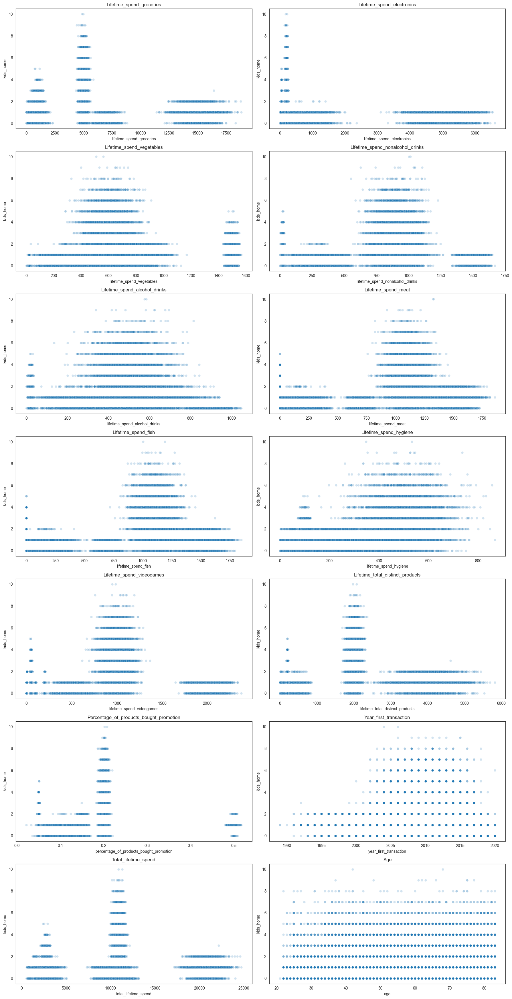

In [41]:
Functions.scatterplot(individuals, continuous, 'kids_home')

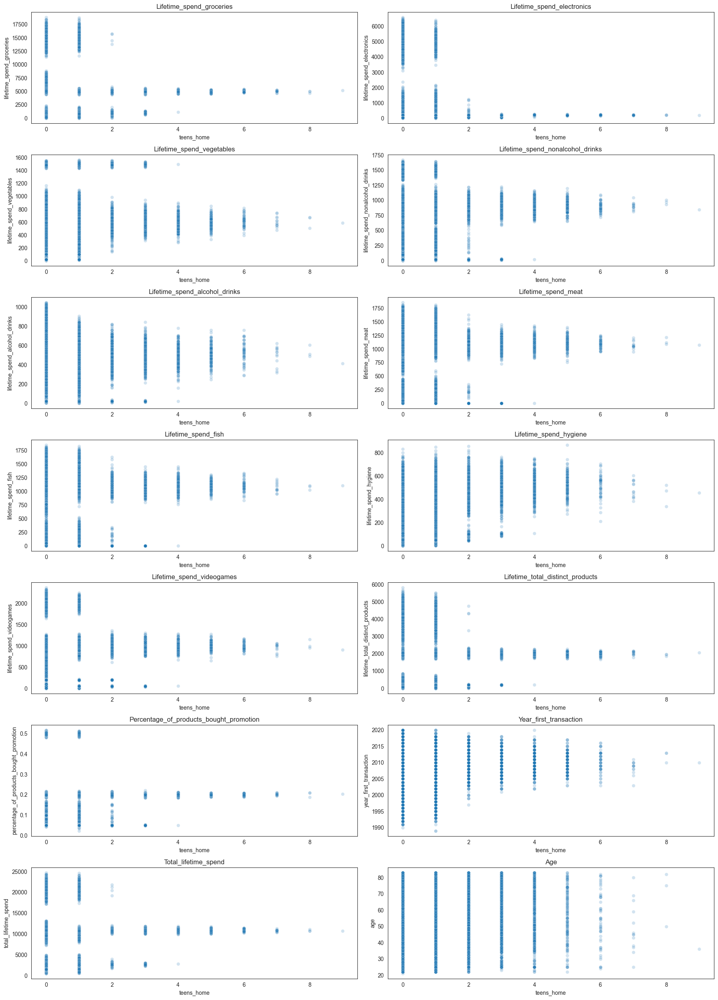

In [43]:

sns.set_style(style='white')
fig, axes = plt.subplots(7, 2, figsize=(18, 25))
for i, col in enumerate(individuals[continuous]):
    row = i // 2
    col_name = continuous[i]
    ax = axes[row][i % 2]
    sns.scatterplot(x='teens_home', y=col_name, data=individuals, ax=ax, alpha = 0.2)
    ax.set_title(col_name.capitalize())

plt.tight_layout()
plt.show()

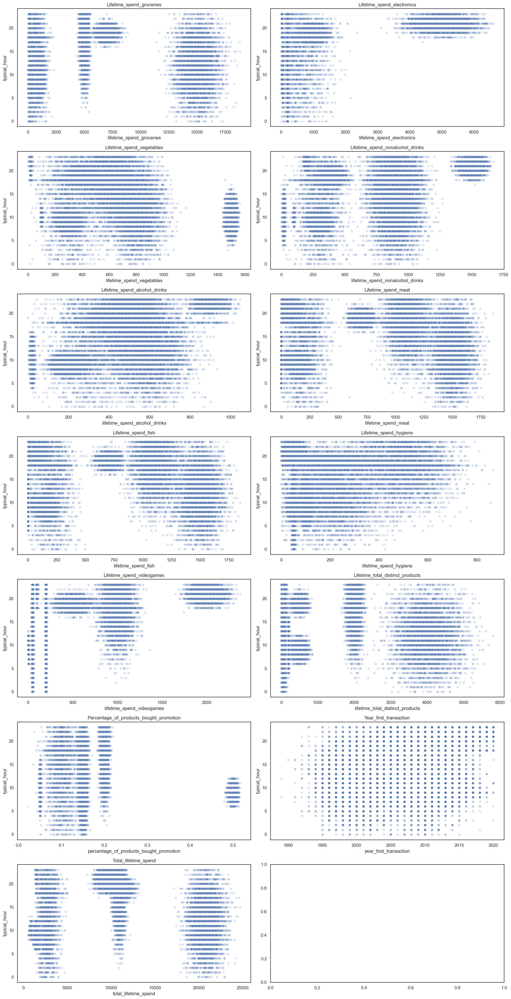

In [ ]:
Functions.scatterplot(individuals, continuous, 'typical_hour')

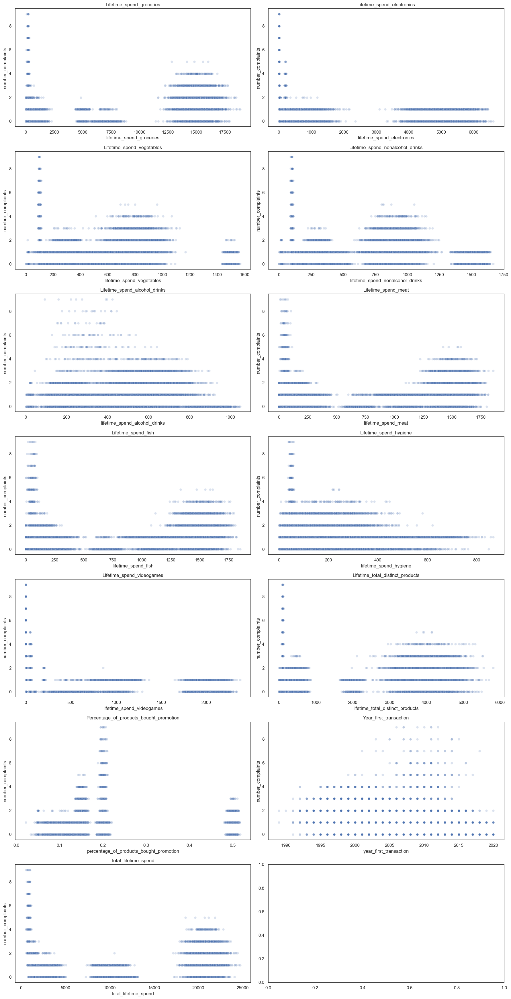

In [ ]:
Functions.scatterplot(individuals, continuous, 'number_complaints')

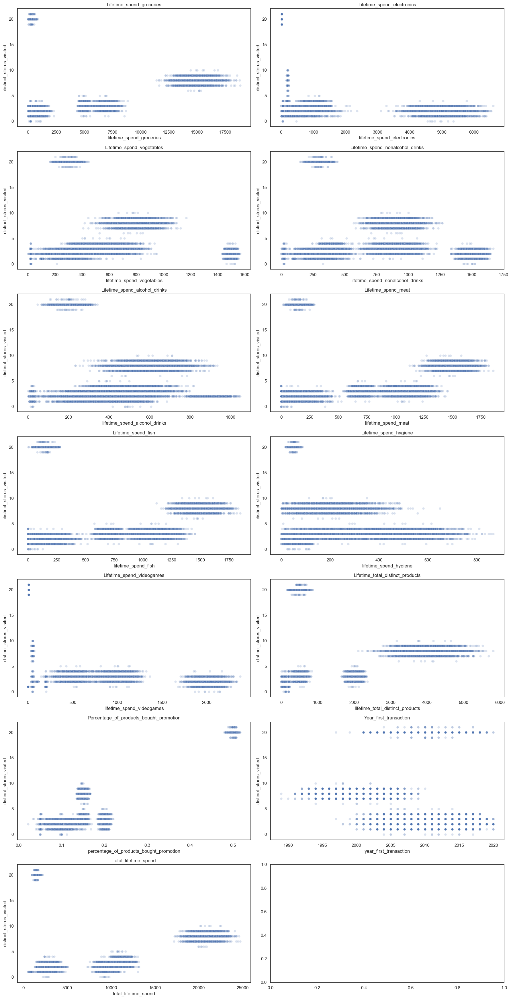

In [ ]:
Functions.scatterplot(individuals, continuous, 'distinct_stores_visited')

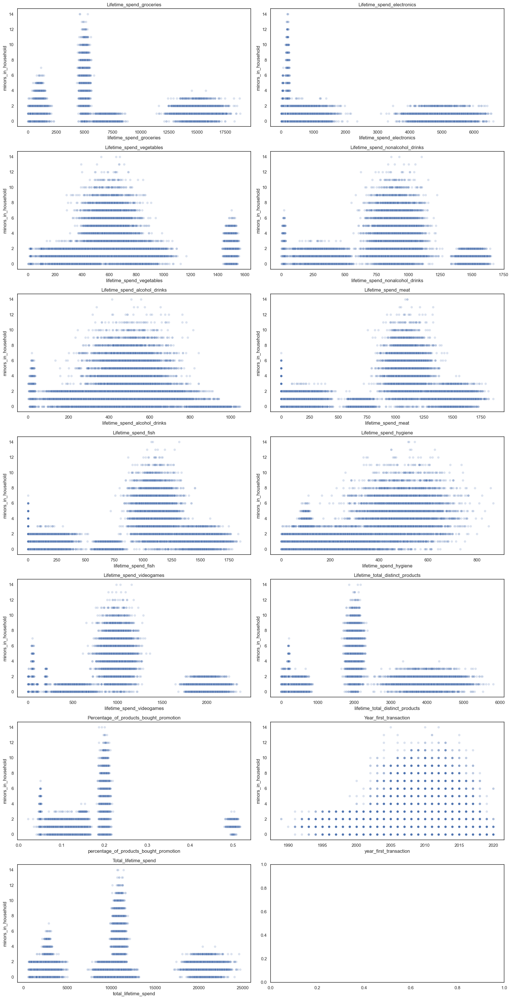

In [ ]:
Functions.scatterplot(individuals, continuous, 'minors_in_household')

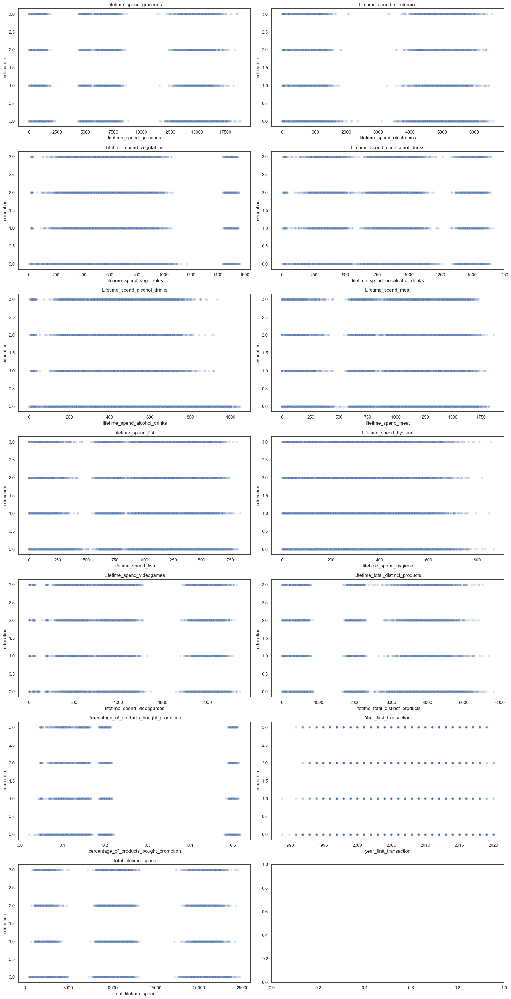

In [ ]:
Functions.scatterplot(individuals, continuous, 'education')

##### Analysis of Features by By Region

**Amount Spent per Region**

In [ ]:
Functions.plot_lisbon_heatmap(region_data, 'latitude_encoded', 'longitude_encoded', 'total_lifetime_spend')

**Average Number of Distinct Products Purchased per Region**

In [ ]:
Functions.plot_lisbon_heatmap(region_data, 'latitude_encoded', 'longitude_encoded', 'lifetime_total_distinct_products')

**Average Number of Distinct Stores Visited per Region**

In [ ]:
Functions.plot_lisbon_heatmap(region_data, 'latitude_encoded', 'longitude_encoded', 'distinct_stores_visited')